# Bird Image Classification Problem using CNNs and Visual Transformers

---

## General Imports

In [1]:
# Import libraries to verify installation
import os
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import random
import keras_tuner as kt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from tqdm import tqdm
from datetime import datetime
from matplotlib.colors import Normalize
import PIL
import pickle
import sys
import json

#tensorflow
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.preprocessing import image, image_dataset_from_directory
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import Callback, EarlyStopping,ModelCheckpoint, ReduceLROnPlateau
from tensorflow.data import AUTOTUNE
from tensorflow.keras.optimizers import Adam


#torch
import torch
from torchvision import datasets, transforms
import torch.nn as nn
from transformers import ViTFeatureExtractor, ViTForImageClassification 
import torch.nn.functional as F
from torch.utils.data import DataLoader, Subset
from torch.optim.lr_scheduler import ReduceLROnPlateau


import warnings
warnings.filterwarnings("ignore")

2024-05-28 16:41:02.645588: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-28 16:41:03.715114: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /anaconda/envs/azureml_py38_PT_and_TF/lib/python3.8/site-packages/cv2/../../lib64:/usr/local/cuda/lib64:/usr/local/cuda-11.4/lib64:/opt/intel/compilers_and_libraries_2018.1.163/linux/tbb/lib/intel64_lin/gcc4.7:/opt/intel/compilers_and_libraries_2018.1.163/linux/compiler/lib/intel64_lin:/opt/intel/compilers_and_libraries_2018.1.163/linux/mkl/lib/intel64_lin::/usr/local/cuda/lib64:/usr/local/cuda/ext

In [2]:
# Check whether Tensorflow has enabled GPU
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print("TensorFlow version:", tf.__version__)
physical_devices = tf.config.experimental.list_physical_devices('GPU')

if physical_devices:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)

Num GPUs Available:  1
TensorFlow version: 2.11.0


## Loading the data

In [3]:
# Import the dataset
train_directory = './train'
test_directory = './test'
validation_directory = './valid'

train_img = [os.path.join(train_directory, f) for f in os.listdir(train_directory)]
test_img = [os.path.join(test_directory, f) for f in os.listdir(test_directory)]
valid_img = [os.path.join(validation_directory, f) for f in os.listdir(validation_directory)]

In [4]:
df_train = pd.read_csv("./birds.csv")
df_train.head()

,class id,filepaths,labels,data set,scientific name
0,0.0,train/ABBOTTS BABBLER/001.jpg,ABBOTTS BABBLER,train,MALACOCINCLA ABBOTTI
1,0.0,train/ABBOTTS BABBLER/007.jpg,ABBOTTS BABBLER,train,MALACOCINCLA ABBOTTI
2,0.0,train/ABBOTTS BABBLER/008.jpg,ABBOTTS BABBLER,train,MALACOCINCLA ABBOTTI
3,0.0,train/ABBOTTS BABBLER/009.jpg,ABBOTTS BABBLER,train,MALACOCINCLA ABBOTTI
4,0.0,train/ABBOTTS BABBLER/002.jpg,ABBOTTS BABBLER,train,MALACOCINCLA ABBOTTI


## Data Loading and Visualisation

We see that we have varying numbers of samples in the training set. In the test and validation sets, we have 5 samples each.

In [5]:
batch_size = 32

In [9]:
# Create an instance of ImageDataGenerator with desired augmentation parameters
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=25,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

# Flow images from directory using the defined data generator
train_generator = train_datagen.flow_from_directory(
    train_directory,
    target_size=(224,224),
    batch_size=batch_size,
    class_mode='categorical',
    color_mode='rgb')

Found 84635 images belonging to 525 classes.


In [6]:
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(test_directory,
                                                    target_size=(224,224),
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    color_mode='rgb')

Found 2625 images belonging to 525 classes.


In [11]:
val_datagen=tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
val_generator = val_datagen.flow_from_directory(validation_directory,
                                                target_size=(224,224),
                                                batch_size=batch_size,
                                                class_mode='categorical',
                                                color_mode='rgb')

Found 2625 images belonging to 525 classes.


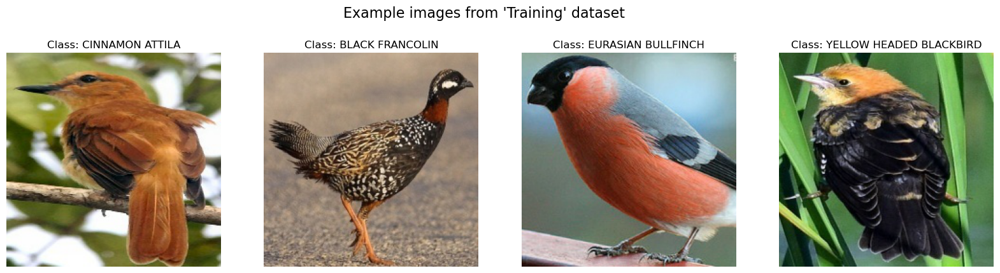

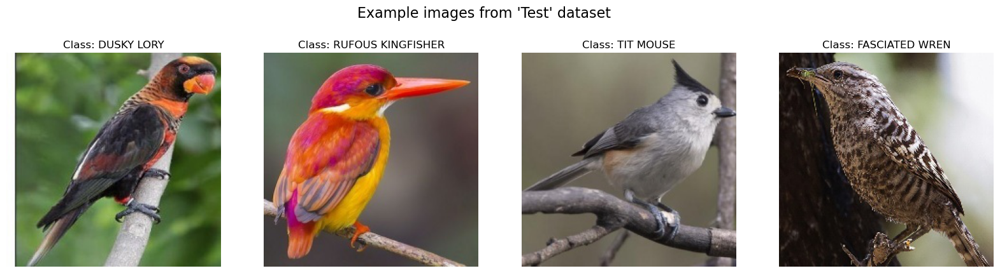

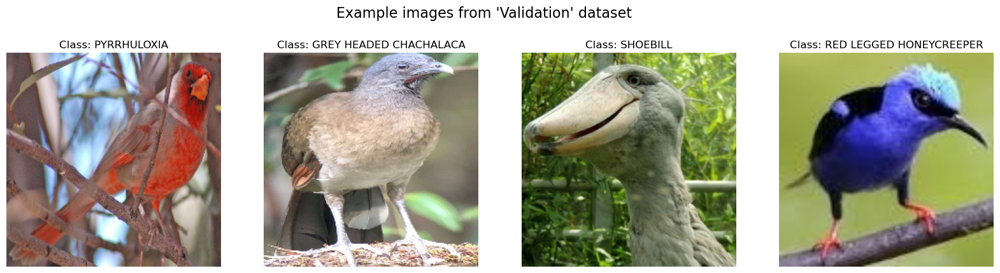

In [8]:
def visualize_data(data_directory, num_images, rows, class_names=None, dataset_name=None):
    plt.figure(figsize=(20, 5))
    if dataset_name:
        plt.suptitle(f"Example images from '{dataset_name}' dataset", fontsize=16)
    classes = os.listdir(data_directory)
    for i in range(num_images):
        # Randomly select a class (bird species)
        class_name = random.choice(classes)
        class_dir = os.path.join(data_directory, class_name)
        # Get a list of images in the class directory
        images = os.listdir(class_dir)
        # Randomly select an image from the class
        image_name = random.choice(images)
        image_path = os.path.join(class_dir, image_name)
        # Load and display the image
        image = Image.open(image_path)
        plt.subplot(rows, num_images // rows, i + 1)
        plt.imshow(image)
        plt.axis('off')
        if class_names is not None:
            plt.title(f"Class: {class_names[class_name]}")
        else:
            plt.title(f"Class: {class_name}")


# Define class names (if available)
class_names = {
    'class1': 'Species 1',
    'class2': 'Species 2',
    # Add more class mappings as needed
}

# Visualize the training data
visualize_data(train_directory, num_images=4, rows=1, dataset_name='Training')

# Visualize the test data
visualize_data(test_directory, num_images=4, rows=1, dataset_name='Test')

# Visualize the validation data
visualize_data(validation_directory, num_images=4, rows=1, dataset_name='Validation')



### Class Distribution

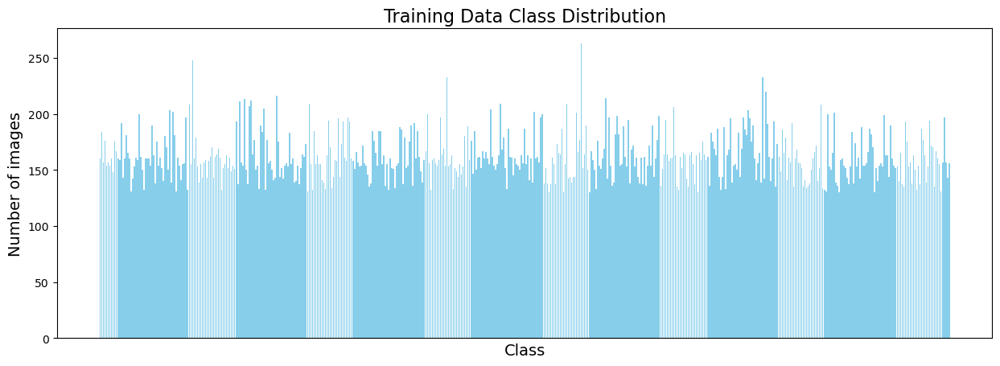

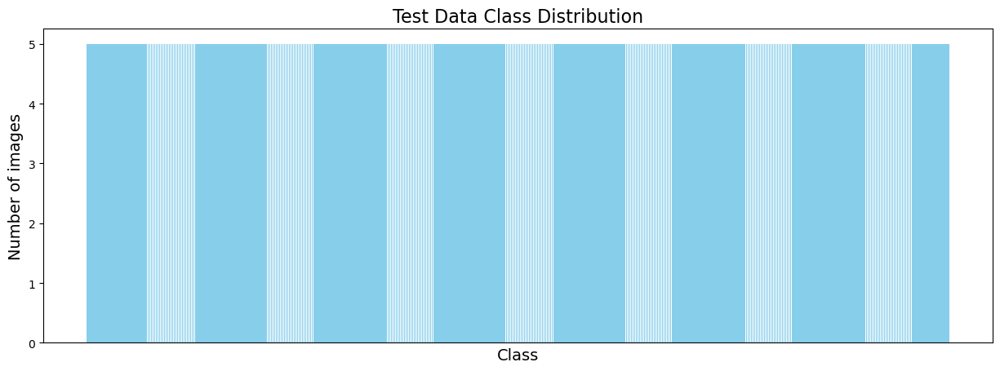

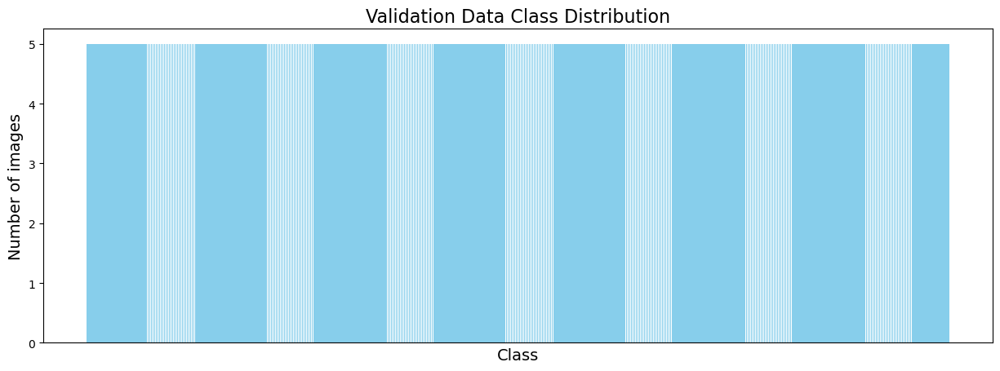

In [ ]:
def plot_class_distribution(data_directory, title):
    # Filter out non-directory files (like .DS_Store)
    classes = [c for c in os.listdir(data_directory) if os.path.isdir(os.path.join(data_directory, c))]
    num_images = [len(os.listdir(os.path.join(data_directory, c))) for c in classes]
    plt.figure(figsize=(15, 5))
    plt.bar(classes, num_images, color='skyblue')
    plt.title(title, fontsize=16)
    plt.xlabel('Class', fontsize=14)
    plt.ylabel('Number of images', fontsize=14)
    plt.xticks([])
    plt.show()
# Plot the class distribution for the training data
plot_class_distribution(train_directory, title='Training Data Class Distribution')

# Plot the class distribution for the test data
plot_class_distribution(test_directory, title='Test Data Class Distribution')

# Plot the class distribution for the validation data
plot_class_distribution(validation_directory, title='Validation Data Class Distribution')


# Models

## CNNs - ResNet50

For this section, we will use the Resnet50 architecture with pretrained weights from the ImageNet dataset. We will use the `imagenet` weights and fine-tune the model on our dataset.

In [ ]:
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom layers on top of the ResNet50 base
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)  # Dropout for regularization
x = Dense(1024, activation='relu', kernel_regularizer=l2(0.001))(x)  # Add L2 regularization
x = BatchNormalization()(x)
x = Dropout(0.5)(x)  # Another Dropout layer for regularization
predictions = Dense(train_generator.num_classes, activation='softmax')(x)

# Construct the final model
model = Model(inputs=base_model.input, outputs=predictions)

model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_4[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

This is an initial run where we trained the model for 15 epochs, but we make the whole model trainable. We're doing this to see how the model performs on the dataset.

In [ ]:
# Create checkpoint callback
checkpoint_path = "birds_classification_model_checkpoint"
checkpoint_callback = ModelCheckpoint(checkpoint_path,
                                      save_weights_only=True,
                                      monitor="val_accuracy",
                                      save_best_only=True)

# Setup EarlyStopping callback to stop training if model's val_loss doesn't improve for 3 epochs
early_stopping = EarlyStopping(monitor = "val_loss", # watch the val loss metric
                               patience = 5,
                               restore_best_weights = True) # if val loss decreases for 3 epochs in a row, stop training

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)
callbacks = [checkpoint_callback, early_stopping, reduce_lr]

In [ ]:
#fit the model
history = model.fit(train_generator,
                    epochs=15,
                    steps_per_epoch=len(train_generator),
                    validation_data=val_generator,
                    validation_steps=len(val_generator),
                    callbacks=callbacks)

timestamp = time.strftime("%Y%m%d-%H%M%S")
model.save(f'Resnet_15epochs_trianable{timestamp}.h5')

Epoch 1/15


2024-05-25 20:26:15.071215: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.30GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-05-25 20:26:15.071266: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.30GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-05-25 20:26:15.082580: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.41GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-05-25 20:26:15.082621: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU

2645/2645 [==============================] - 909s 331ms/step - loss: 6.7543 - accuracy: 0.0427 - val_loss: 12.4253 - val_accuracy: 0.0530 - lr: 0.0010
Epoch 2/15
2645/2645 [==============================] - 879s 332ms/step - loss: 4.5516 - accuracy: 0.2522 - val_loss: 3.7133 - val_accuracy: 0.4773 - lr: 0.0010
Epoch 3/15
2645/2645 [==============================] - 875s 331ms/step - loss: 3.4916 - accuracy: 0.4560 - val_loss: 2.5686 - val_accuracy: 0.6606 - lr: 0.0010
Epoch 4/15
2645/2645 [==============================] - 864s 327ms/step - loss: 3.0515 - accuracy: 0.5509 - val_loss: 3.9452 - val_accuracy: 0.4964 - lr: 0.0010
Epoch 5/15
2645/2645 [==============================] - 862s 326ms/step - loss: 2.7390 - accuracy: 0.6169 - val_loss: 2.7096 - val_accuracy: 0.6320 - lr: 0.0010
Epoch 6/15
2645/2645 [==============================] - 863s 326ms/step - loss: 2.5187 - accuracy: 0.6610 - val_loss: 5.9528 - val_accuracy: 0.5760 - lr: 0.0010
Epoch 7/15
2645/2645 [======================

We plot the results of the training and validation losses and accuracies.

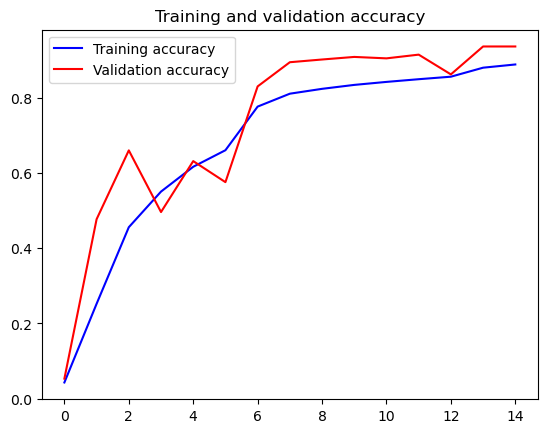

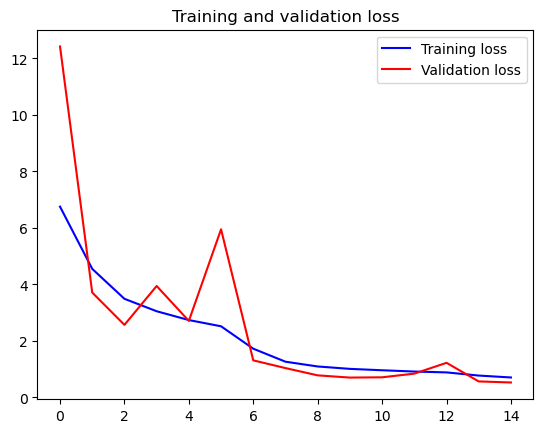

In [ ]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'b', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation accuracy')

plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')

plt.title('Training and validation loss')
plt.legend()
plt.show()

In [ ]:
results = model.evaluate(test_generator)

print(f"Test accuracy: {results[1] * 100:.2f}%")
print(f"Test loss: {results[0]:.2f}")

83/83 [==============================] - 5s 60ms/step - loss: 0.4582 - accuracy: 0.9589
Test accuracy: 95.89%
Test loss: 0.46


### Hyperparameter Tuning

For this section, we implement Bayesian Optimization to tune the hyperparameters of the model. We will tune the learning rate, the dropout rate present in the dense layers, and the number of layers to freeze (or conversely the number of layers to make trainable) in the model.

In [ ]:
class MyHyperModel(kt.HyperModel):    
    def build(self, hp):
        # Define the structure of the model
        base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

        # Unfreeze layers based on hyperparameter
        trainable_layers = hp.Int('trainable_layers', min_value=50, max_value=len(base_model.layers), step=10)
        for layer in base_model.layers[:-trainable_layers]:
            layer.trainable = False
        for layer in base_model.layers[-trainable_layers:]:
            layer.trainable = True

        x = base_model.output
        x = GlobalAveragePooling2D()(x)
        x = BatchNormalization()(x)
        
        # Dropout rate as hyperparameter
        dropout_rate = hp.Float('dropout_rate', min_value=0.3, max_value=0.5, step=0.05)
        x = Dropout(dropout_rate)(x)
        
        x = Dense(1024, activation='relu', kernel_regularizer='l2')(x)
        x = BatchNormalization()(x)
        x = Dropout(dropout_rate)(x)
        
        predictions = Dense(525, activation='softmax')(x)
        
        model = Model(inputs=base_model.input, outputs=predictions)
        
        # Learning rate as hyperparameter
        learning_rate = hp.Float('learning_rate', min_value=1e-4, max_value=1e-3, sampling='LOG')
        optimizer = Adam(learning_rate=learning_rate)
        
        model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
        
        return model

In [ ]:
from keras_tuner import BayesianOptimization

tuner = BayesianOptimization(
    MyHyperModel(),
    objective='val_accuracy',
    max_trials=20,
    directory='tuner_dir',
    project_name='Resnet50_Fine_Tuning'
)

tuner.search_space_summary()

Reloading Tuner from tuner_dir/Resnet50_Fine_Tuning/tuner0.json
Search space summary
Default search space size: 3
trainable_layers (Int)
{'default': None, 'conditions': [], 'min_value': 50, 'max_value': 175, 'step': 10, 'sampling': 'linear'}
dropout_rate (Float)
{'default': 0.3, 'conditions': [], 'min_value': 0.3, 'max_value': 0.5, 'step': 0.05, 'sampling': 'linear'}
learning_rate (Float)
{'default': 0.0001, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.001, 'step': None, 'sampling': 'log'}


Since hyperparameter tuning is computationally expensive, we will use a smaller number of epochs to train the model, as well as only 25% of the training set. This should allow us to get a good idea of the hyperparameters that work well for the model. We are not looking to maximize accuracy, but to find a good set of hyperparameters that we can use to train the model further. We will use these optimal set of hyperparameters to train the model for a larger number of epochs.

In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=25,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.75)

In [ ]:
val_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
train_generator = train_datagen.flow_from_directory(
    train_directory,
    target_size=(224,224),
    batch_size=batch_size,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=True,
    subset='training')

val_generator = val_datagen.flow_from_directory(
    validation_directory,
    target_size=(224,224),
    batch_size=batch_size,
    class_mode='categorical',
    color_mode='rgb')


Found 21347 images belonging to 525 classes.
Found 2625 images belonging to 525 classes.


In [ ]:
# Define early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',  # Watch validation loss
    patience=5,           # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True  # Restore model weights from the epoch with the best value of the monitored quantity
)

# Define learning rate reduction callback
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',  # Watch validation loss
    factor=0.2,           # Factor by which the learning rate will be reduced
    patience=3,           # Number of epochs with no improvement after which learning rate will be reduced
    min_lr=1e-6           # Lower bound on the learning rate
)

# Define model checkpoint callback
model_checkpoint = ModelCheckpoint(
    filepath='best_model.h5',  # Path to save the best model
    monitor='val_accuracy',    # Watch validation accuracy
    save_best_only=True,       # Save only the best model
    save_weights_only=False,   # Save the entire model, including weights and architecture
    mode='max'                 # Mode for monitoring the quantity to be maximized (accuracy in this case)
)

# Add the callbacks to a list
callbacks = [early_stopping, reduce_lr, model_checkpoint]

In [ ]:
tuner.search(
    train_generator,
    validation_data=val_generator,
    epochs=5,
    steps_per_epoch=len(train_generator),
    validation_steps=len(val_generator),
    callbacks=callbacks,
    verbose=1
)

Trial 20 Complete [00h 19m 43s]
val_accuracy: 0.7577142715454102

Best val_accuracy So Far: 0.7931428551673889
Total elapsed time: 09h 28m 05s


In [ ]:
tuner.results_summary()

best_model = tuner.get_best_models(num_models=1)[0]

Results summary
Results in tuner_dir/Resnet50_Fine_Tuning
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 10 summary
Hyperparameters:
trainable_layers: 160
dropout_rate: 0.5
learning_rate: 0.0001
Score: 0.7931428551673889

Trial 12 summary
Hyperparameters:
trainable_layers: 160
dropout_rate: 0.5
learning_rate: 0.0001
Score: 0.7756190299987793

Trial 17 summary
Hyperparameters:
trainable_layers: 160
dropout_rate: 0.5
learning_rate: 0.00010685348248246104
Score: 0.7649523615837097

Trial 19 summary
Hyperparameters:
trainable_layers: 160
dropout_rate: 0.5
learning_rate: 0.00010321952730594419
Score: 0.7577142715454102

Trial 13 summary
Hyperparameters:
trainable_layers: 160
dropout_rate: 0.5
learning_rate: 0.00011605547997087965
Score: 0.7420952320098877

Trial 16 summary
Hyperparameters:
trainable_layers: 140
dropout_rate: 0.5
learning_rate: 0.0001
Score: 0.5512381196022034

Trial 09 summary
Hyperparameters:
trainable_layers: 140
dropout_rate: 0.5
learning_r

In [ ]:
def read_json(file_path):
    with open(file_path, 'r') as file:
        data = json.load(file)
    return data

def access_score(data):
    return data['score']

In [ ]:
#get all the file paths in tuner_dir/Resnet50_Fine_Tuning

tuner_dir = 'tuner_dir/Resnet50_Fine_Tuning'
tuner_subdirs = [os.path.join(tuner_dir, f) for f in os.listdir(tuner_dir) if os.path.isdir(os.path.join(tuner_dir, f))]

# Get the scores from each trial
scores = []
for subdir in tuner_subdirs:
    trial = read_json(os.path.join(subdir, 'trial.json'))
    score = access_score(trial)
    scores.append(score)
    
# get the best model

best_trial = tuner_subdirs[np.argmax(scores)]

# load hyperparameters of the best trial

best_hyperparameters = read_json(os.path.join(best_trial, 'trial.json'))['hyperparameters']['values']
best_hyperparameters

{'trainable_layers': 160, 'dropout_rate': 0.5, 'learning_rate': 0.0001}

We have now obtained our optimal set of hyperparameters. We will now train the model on the entire training set using these hyperparameters for 50 epochs. This will be our final model.

### Training on best hyperparameters

In [ ]:
# Define the structure of the model

base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Unfreeze layers based on hyperparameter

trainable_layers = best_hyperparameters['trainable_layers']
for layer in base_model.layers[:-trainable_layers]:
    layer.trainable = False
for layer in base_model.layers[-trainable_layers:]:
    layer.trainable = True

x = base_model.output

x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)

# Dropout rate as hyperparameter

dropout_rate = best_hyperparameters['dropout_rate']
x = Dropout(dropout_rate)(x)

x = Dense(1024, activation='relu', kernel_regularizer='l2')(x)
x = BatchNormalization()(x)
x = Dropout(dropout_rate)(x)

predictions = Dense(525, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Learning rate as hyperparameter

learning_rate = best_hyperparameters['learning_rate']
optimizer = Adam(learning_rate=learning_rate)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

2024-05-27 11:32:59.133354: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-27 11:33:01.066488: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 7243 MB memory:  -> device: 0, name: Tesla V100-PCIE-16GB, pci bus id: 0001:00:00.0, compute capability: 7.0


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

In [ ]:
# Define early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',  # Watch validation loss
    patience=5,           # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True  # Restore model weights from the epoch with the best value of the monitored quantity
)

# Define learning rate reduction callback
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',  # Watch validation loss
    factor=0.2,           # Factor by which the learning rate will be reduced
    patience=3,           # Number of epochs with no improvement after which learning rate will be reduced
    min_lr=1e-7           # Lower bound on the learning rate
)

# Define model checkpoint callback
model_checkpoint = ModelCheckpoint(
    filepath='Resnet50_50epochs_fulldataset.h5',  # Path to save the best model
    monitor='val_accuracy',    # Watch validation accuracy
    save_best_only=True,       # Save only the best model
    save_weights_only=False,   # Save the entire model, including weights and architecture
    mode='max'                 # Mode for monitoring the quantity to be maximized (accuracy in this case)
)

# Add the callbacks to a list
callbacks = [early_stopping, reduce_lr, model_checkpoint]

In [ ]:
history = model.fit(train_generator, 
                    epochs = 50, 
                    steps_per_epoch=len(train_generator), 
                    validation_data=val_generator,
                    validation_steps=len(val_generator), 
                    callbacks=callbacks)

timestamp = time.strftime("%Y%m%d-%H%M%S")
model.save(f'Resnet50_fine_tuned_full_dataset{timestamp}.h5')

Epoch 1/50


2024-05-27 11:38:34.578018: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x5555e9a22eb0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-05-27 11:38:34.578060: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): Tesla V100-PCIE-16GB, Compute Capability 7.0
2024-05-27 11:38:34.588613: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-05-27 11:38:34.721920: I tensorflow/compiler/jit/xla_compilation_cache.cc:477] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


2645/2645 [==============================] - 935s 339ms/step - loss: 11.6751 - accuracy: 0.3432 - val_loss: 5.0200 - val_accuracy: 0.8328 - lr: 1.0000e-04
Epoch 2/50
2645/2645 [==============================] - 891s 337ms/step - loss: 3.6104 - accuracy: 0.7382 - val_loss: 1.7868 - val_accuracy: 0.9166 - lr: 1.0000e-04
Epoch 3/50
2645/2645 [==============================] - 887s 335ms/step - loss: 1.7750 - accuracy: 0.8179 - val_loss: 1.0679 - val_accuracy: 0.9238 - lr: 1.0000e-04
Epoch 4/50
2645/2645 [==============================] - 863s 326ms/step - loss: 1.2667 - accuracy: 0.8507 - val_loss: 0.8311 - val_accuracy: 0.9425 - lr: 1.0000e-04
Epoch 5/50
2645/2645 [==============================] - 865s 327ms/step - loss: 1.0767 - accuracy: 0.8683 - val_loss: 0.7556 - val_accuracy: 0.9429 - lr: 1.0000e-04
Epoch 6/50
2645/2645 [==============================] - 864s 327ms/step - loss: 0.9751 - accuracy: 0.8812 - val_loss: 0.7468 - val_accuracy: 0.9375 - lr: 1.0000e-04
Epoch 7/50
2645/2645

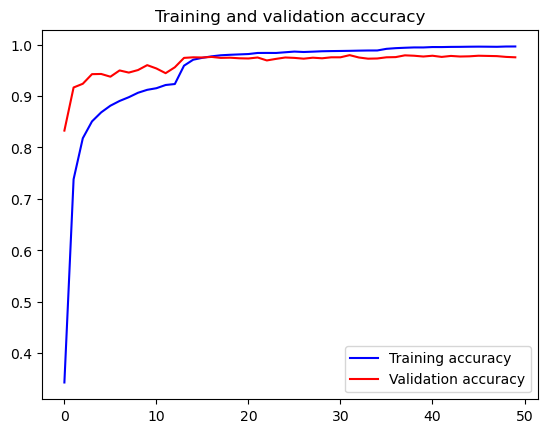

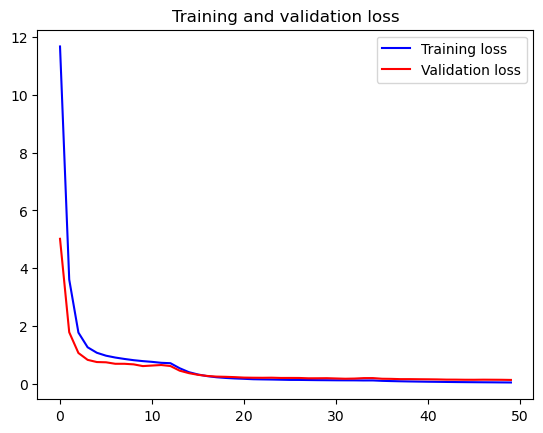

In [ ]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'b', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation accuracy')

plt.title('Training and validation accuracy')
plt.legend()
plt.figure()

plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')

plt.title('Training and validation loss')
plt.legend()
plt.show()

In [ ]:
# save history to a pickle file
import pickle

with open(f'history_resnet50_fine_tuned_full_dataset{timestamp}.pkl', 'wb') as file:
    pickle.dump(history.history, file)

In [ ]:
with open(f'history_resnet50_fine_tuned_full_dataset{timestamp}.pkl', 'rb') as file:
    history = pickle.load(file)

### Testing and Evaluation

In this section, we will evaluate the model on the test set. We also display the incorrectly classified images.

In [7]:
best_model = load_model('Resnet50_50epochs_fulldataset.h5')

results = best_model.evaluate(test_generator)

print(f"Test accuracy: {results[1] * 100:.2f}%")
print(f"Test loss: {results[0]:.2f}")

2024-05-28 16:42:37.681906: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-28 16:42:39.287273: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 7243 MB memory:  -> device: 0, name: Tesla V100-PCIE-16GB, pci bus id: 0001:00:00.0, compute capability: 7.0
2024-05-28 16:42:46.372304: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8907


83/83 [==============================] - 15s 104ms/step - loss: 0.1234 - accuracy: 0.9890
Test accuracy: 98.90%
Test loss: 0.12


Found 2625 images belonging to 525 classes.
83/83 [==============================] - 7s 76ms/step
29 incorrectly classified images


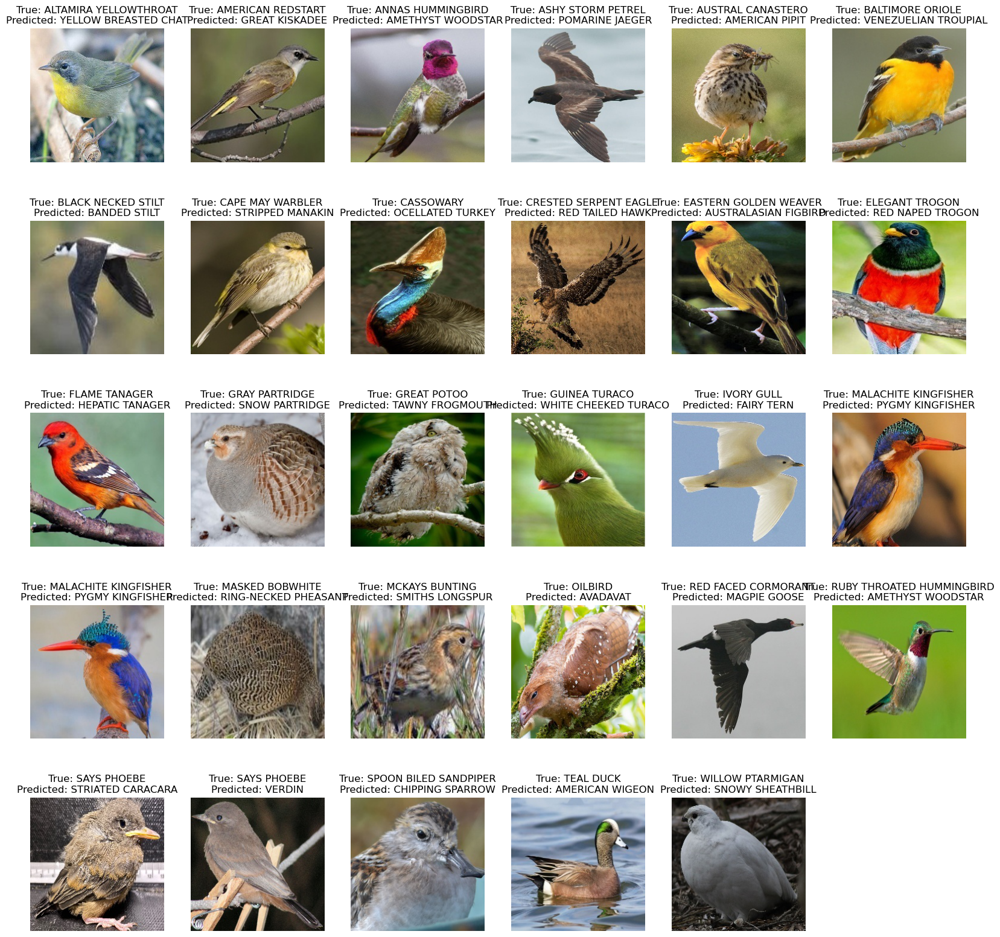

                               precision    recall  f1-score   support

              ABBOTTS BABBLER       1.00      1.00      1.00         5
                ABBOTTS BOOBY       1.00      1.00      1.00         5
   ABYSSINIAN GROUND HORNBILL       1.00      1.00      1.00         5
        AFRICAN CROWNED CRANE       1.00      1.00      1.00         5
       AFRICAN EMERALD CUCKOO       1.00      1.00      1.00         5
            AFRICAN FIREFINCH       1.00      1.00      1.00         5
       AFRICAN OYSTER CATCHER       1.00      1.00      1.00         5
        AFRICAN PIED HORNBILL       1.00      1.00      1.00         5
          AFRICAN PYGMY GOOSE       1.00      1.00      1.00         5
                    ALBATROSS       1.00      1.00      1.00         5
               ALBERTS TOWHEE       1.00      1.00      1.00         5
         ALEXANDRINE PARAKEET       1.00      1.00      1.00         5
                ALPINE CHOUGH       1.00      1.00      1.00         5
     

In [8]:
# get incorrectly classified images and display them

test_generator = test_datagen.flow_from_directory(test_directory,
                                                    target_size=(224,224),
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    color_mode='rgb',
                                                    shuffle=False)

predictions = best_model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

incorrect_indices = np.where(predicted_classes != true_classes)[0]

df_test = pd.DataFrame(test_generator.filenames, columns=['filename'])
df_test['true_class'] = true_classes
df_test['predicted_class'] = predicted_classes

print(len(incorrect_indices), "incorrectly classified images")

#display all misclassified images using df_test
plt.figure(figsize=(20, 20))
for i, idx in enumerate(incorrect_indices):
    img = Image.open(os.path.join(test_directory, df_test.loc[idx, 'filename']))
    plt.subplot(5, len(incorrect_indices)//5 + 1, i+1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"True: {class_labels[df_test.loc[idx, 'true_class']]}\nPredicted: {class_labels[df_test.loc[idx, 'predicted_class']]}")
plt.show()

# get classification report

print(classification_report(true_classes, predicted_classes, target_names=class_labels))
    

Here we take three images from the misclassfied images and display them alongside a sampe of the predicted class.

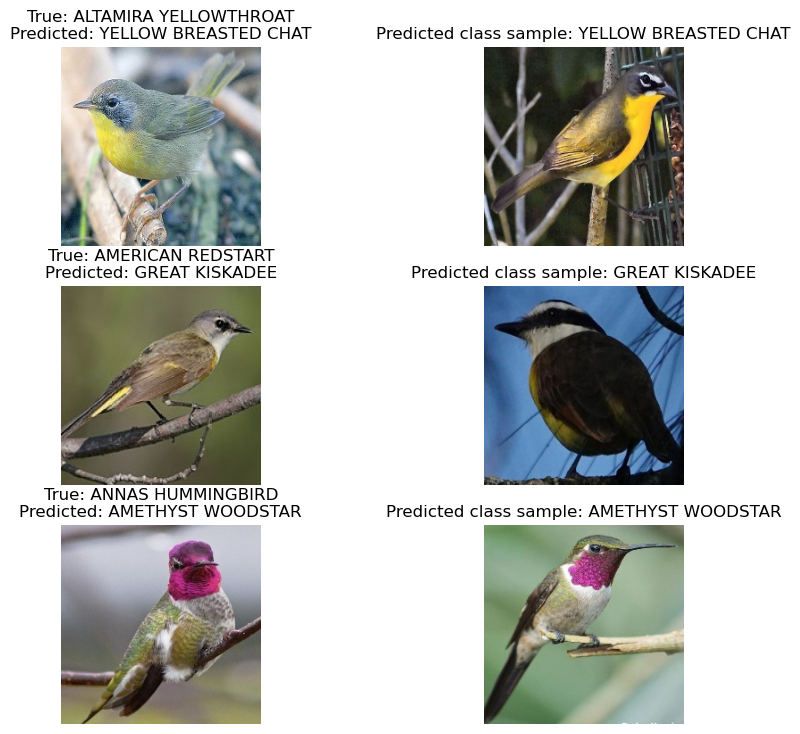

In [13]:
# Take three images which were misclassified and display them alongside a sample image of the predicted class

# Get the indices of the first three misclassified images

misclassified_indices = incorrect_indices[:3]

# Get the filenames of the misclassified images
misclassified_files = [df_test.loc[idx, 'filename'] for idx in misclassified_indices]

# Get the true and predicted classes of the misclassified images
misclassified_true_classes = [df_test.loc[idx, 'true_class'] for idx in misclassified_indices]
misclassified_predicted_classes = [df_test.loc[idx, 'predicted_class'] for idx in misclassified_indices]

# Get the class labels of the misclassified images
misclassified_true_labels = [class_labels[cls] for cls in misclassified_true_classes]
misclassified_predicted_labels = [class_labels[cls] for cls in misclassified_predicted_classes]

# Display the misclassified images alongside a sample image of the predicted class
plt.figure(figsize=(10, 15))

for i, (filename, true_label, predicted_label) in enumerate(zip(misclassified_files, misclassified_true_labels, misclassified_predicted_labels)):
    # Load the misclassified image
    img = Image.open(os.path.join(test_directory, filename))
    
    # Get the class directory of the predicted class
    predicted_class_dir = os.path.join(train_directory, class_labels[misclassified_predicted_classes[i]])
    
    # Get a list of images in the class directory
    predicted_class_images = os.listdir(predicted_class_dir)
    
    # Randomly select an image from the class
    predicted_image_name = random.choice(predicted_class_images)
    predicted_image_path = os.path.join(predicted_class_dir, predicted_image_name)
    
    # Load and display the predicted image
    predicted_image = Image.open(predicted_image_path)
    
    # Display the misclassified image
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"True: {true_label}\nPredicted: {predicted_label}")
    
    # Display the predicted image
    plt.subplot(5, 2, 2*i+2)
    plt.imshow(predicted_image)
    plt.axis('off')
    plt.title(f"Predicted class sample: {predicted_label}")

plt.show()


Here, we check the labels which were misclassified and the corresponding images. We also see the accuracy for each label if it was misclassified atleast once.

In [ ]:
# print accuracy of misclassified labels

incorrect_labels = df_test.loc[incorrect_indices, 'true_class'].value_counts()

# display the accuracy of misclassified labels with the class name (sorted by bird species name)
incorrect_labels = incorrect_labels.sort_index()
for label, count in incorrect_labels.items():
    print(f"{class_labels[label]}: {count} images misclassified")
    print(f"Accuracy: {1 - count/len(df_test[df_test['true_class'] == label]):.2f}")


ALTAMIRA YELLOWTHROAT: 1 images misclassified
Accuracy: 0.80
AMERICAN REDSTART: 1 images misclassified
Accuracy: 0.80
ANNAS HUMMINGBIRD: 1 images misclassified
Accuracy: 0.80
ASHY STORM PETREL: 1 images misclassified
Accuracy: 0.80
AUSTRAL CANASTERO: 1 images misclassified
Accuracy: 0.80
BALTIMORE ORIOLE: 1 images misclassified
Accuracy: 0.80
BLACK NECKED STILT: 1 images misclassified
Accuracy: 0.80
CAPE MAY WARBLER: 1 images misclassified
Accuracy: 0.80
CASSOWARY: 1 images misclassified
Accuracy: 0.80
CRESTED SERPENT EAGLE: 1 images misclassified
Accuracy: 0.80
EASTERN GOLDEN WEAVER: 1 images misclassified
Accuracy: 0.80
ELEGANT TROGON: 1 images misclassified
Accuracy: 0.80
FLAME TANAGER: 1 images misclassified
Accuracy: 0.80
GRAY PARTRIDGE: 1 images misclassified
Accuracy: 0.80
GREAT POTOO: 1 images misclassified
Accuracy: 0.80
GUINEA TURACO: 1 images misclassified
Accuracy: 0.80
IVORY GULL: 1 images misclassified
Accuracy: 0.80
MALACHITE KINGFISHER: 2 images misclassified
Accuracy: 

## Vision Transformer

In this section, we use the Vision Transformer model from google, specifcally vit-base-patch16-224. We will be using Pytorch for this part of the project

### Loading the dataloader and model

The datalaoding process will be similar to the CNN. We create three dataloaders, one for each: Training Set, Validation Set, Testing Set. The training dataloader also includes a data augmentation proces to add robustness to our model. For both validationa and testing porpuses the data augmentation is disregarded. The final step for each of the dataloaders is to feed the images into the model specific feature extractor to ensure the correct input format. 

In [17]:
# Load the feature extractor
feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224')

# One-hot encode function
def one_hot_encode(labels, num_classes):
    return F.one_hot(labels, num_classes=num_classes)

# Define the custom collate function
def collate(batch):
    images, labels = zip(*batch)

    encoding = feature_extractor(images=list(images), return_tensors="pt", do_rescale=False)
    pixel_values = encoding["pixel_values"]
    labels = torch.tensor(labels)
    return pixel_values, labels

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(), 
    transforms.RandomRotation(15),
    transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1), shear=10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.GaussianBlur(kernel_size=(3, 3), sigma=(0.1, 2.0)),
    transforms.ToTensor(),
])

# Define data transformations for validation and testing (no augmentation)
eval_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Load the datasets with appropriate transformations
train_dataset = datasets.ImageFolder(root='./train', transform=train_transform)
valid_dataset = datasets.ImageFolder(root='./valid', transform=eval_transform)
test_dataset = datasets.ImageFolder(root='./test', transform=eval_transform)

# Select a subset of the training data for testing porpuses
# subset_indices = np.random.choice(len(train_dataset), int(len(train_dataset) * 0.01), replace=False)  # for example, 10% of the data
# subset_train_dataset = Subset(train_dataset, subset_indices)

# Create DataLoader instances with the custom collate function
batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, collate_fn=collate)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, num_workers=4, collate_fn=collate)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4, collate_fn=collate)

for images, labels in DataLoader(train_dataset, batch_size=1, collate_fn=collate):
    print(images.shape, labels.shape)
    break

torch.Size([1, 3, 224, 224]) torch.Size([1])


We now define and load our model and add a linear classifcation layer for our purpuses ontop of it.

In [18]:
num_classes = len(train_dataset.classes)  # Automatically determine the number of classes

# Update the classifier to match the number of classes
model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224')
model.classifier = nn.Linear(model.classifier.in_features, num_classes)
model.config.num_labels = num_classes

# Check if GPU is available and move model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0): ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=768, out_

### Training the model

This is a custome traing loop that iterates over epochs and batches of the training set. This code block includes: 
- Saving the model and its results after earch iteration
- Learningrate Scheduler
- Early stopping if the model is not improving anymore
- Weight Decay for regularization

In [ ]:
model_id = "final_full_model"
os.mkdir(f"./ViT_saves/{model_id}")

results = {}

# Define the loss function
criterion = nn.CrossEntropyLoss()

# Define the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, verbose=True)

ending_epochs = 50
starting_epoch = 0

# Add an early stopping mechanism
best_val_loss = float('inf')
patience = 10
patience_counter = 0

for epoch in range(starting_epoch, ending_epochs, 1):
    model.train()
    running_loss = 0.0
    running_corrects = 0
    total_samples = 0

    # Wrap your data loader with tqdm for a progress bar
    # progress_bar = tqdm(enumerate(train_loader), total=len(train_loader), desc=f'Epoch {epoch+1}/{ending_epochs}')
    # for batch_idx, (pixel_values, labels) in progress_bar:
    for batch_idx, (pixel_values, labels) in enumerate(train_loader):
        pixel_values = pixel_values.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(pixel_values)
        logits = outputs.logits
        loss = criterion(logits, labels)
        loss.backward()
        optimizer.step()

        _, preds = torch.max(logits, 1)
        num_corrects = torch.sum(preds == labels.data)
        running_corrects += num_corrects
        total_samples += labels.size(0)

        running_loss += loss.item()
        batch_accuracy = num_corrects.double() / labels.size(0)
        running_accuracy = running_corrects / total_samples

        # Update the progress bar with loss and accuracy
        # progress_bar.set_postfix({'Running Loss': f'{running_loss/(batch_idx+1):.4f}', 'Running Accuracy': f'{running_accuracy:.4f}'})
    
    
    model_save_path = f'./ViT_saves/{model_id}/model_epoch_{epoch+1}.pt'
    torch.save(model.state_dict(), model_save_path)

    # Validation phase
    model.eval()
    val_loss = 0
    val_running_corrects = 0
    val_total_samples = 0
    
    with torch.no_grad():
        for val_pixel_values, val_labels in valid_loader:
            val_pixel_values = val_pixel_values.to(device)
            val_labels = val_labels.to(device)
            
            val_outputs = model(val_pixel_values)


            val_logits = val_outputs.logits
            val_loss = criterion(val_logits, val_labels)
            _, val_preds = torch.max(val_logits, 1)
            val_running_corrects += torch.sum(val_preds == val_labels.data)
            val_total_samples += val_labels.size(0)

    val_accuracy = val_running_corrects.double() / val_total_samples
    print(f'Epoch {epoch+1}/{ending_epochs} done:', 'Running Loss: ', f'{running_loss/(batch_idx+1):.4f}', 'Running Accuracy: ', f'{running_accuracy:.4f}', f'Validation Loss: {val_loss.item():.4f}', f'Validation Accuracy: {val_accuracy:.4f}')

    scheduler.step(val_loss)
    

    results[epoch+1] = [val_accuracy.item() , running_corrects.item() / total_samples, val_loss.item(), running_loss/(batch_idx+1)]
    
    # Save the data to a file
    with open(f'./ViT_saves/{model_id}/results.pickle', 'wb') as file:
        pickle.dump(results, file)

    if val_loss <= best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0  
    else:
        patience_counter += 1
    
    if patience_counter >= patience:
        print("Finished due to early stopping")
        break

Epoch 1/50 done: Running Loss:  0.8962 Running Accuracy:  0.8609 Validation Loss: 2.6030 Validation Accuracy: 0.9710


Epoch 2/50 done: Running Loss:  0.1816 Running Accuracy:  0.9556 Validation Loss: 0.3213 Validation Accuracy: 0.9710


Epoch 3/50 done: Running Loss:  0.1303 Running Accuracy:  0.9654 Validation Loss: 0.9900 Validation Accuracy: 0.9726


Epoch 4/50 done: Running Loss:  0.1034 Running Accuracy:  0.9712 Validation Loss: 1.6645 Validation Accuracy: 0.9695


Epoch 5/50 done: Running Loss:  0.0907 Running Accuracy:  0.9744 Validation Loss: 4.3495 Validation Accuracy: 0.9726


Epoch 6/50 done: Running Loss:  0.0815 Running Accuracy:  0.9765 Validation Loss: 0.2477 Validation Accuracy: 0.9676


Epoch 7/50 done: Running Loss:  0.0740 Running Accuracy:  0.9786 Validation Loss: 0.0203 Validation Accuracy: 0.9707


Epoch 8/50 done: Running Loss:  0.0652 Running Accuracy:  0.9809 Validation Loss: 0.5273 Validation Accuracy: 0.9695


Epoch 9/50 done: Running Loss:  0.0660 Running Accuracy:  0.9808 Validation Loss: 1.7864 Validation Accuracy: 0.9699


Epoch 10/50 done: Running Loss:  0.0600 Running Accuracy:  0.9826 Validation Loss: 1.6545 Validation Accuracy: 0.9646


Epoch 11/50 done: Running Loss:  0.0588 Running Accuracy:  0.9827 Validation Loss: 0.9877 Validation Accuracy: 0.9726
Epoch 00011: reducing learning rate of group 0 to 1.0000e-05.


Epoch 12/50 done: Running Loss:  0.0206 Running Accuracy:  0.9940 Validation Loss: 1.7919 Validation Accuracy: 0.9817


Epoch 13/50 done: Running Loss:  0.0100 Running Accuracy:  0.9970 Validation Loss: 2.6302 Validation Accuracy: 0.9821


Epoch 14/50 done: Running Loss:  0.0076 Running Accuracy:  0.9976 Validation Loss: 1.2605 Validation Accuracy: 0.9848


Epoch 15/50 done: Running Loss:  0.0067 Running Accuracy:  0.9979 Validation Loss: 0.5986 Validation Accuracy: 0.9848
Epoch 00015: reducing learning rate of group 0 to 1.0000e-06.


Epoch 16/50 done: Running Loss:  0.0052 Running Accuracy:  0.9986 Validation Loss: 0.9079 Validation Accuracy: 0.9848


Epoch 17/50 done: Running Loss:  0.0045 Running Accuracy:  0.9985 Validation Loss: 1.0045 Validation Accuracy: 0.9855
Finished due to early stopping


Here we plot our training and validation results before determine and laod our best performing model.

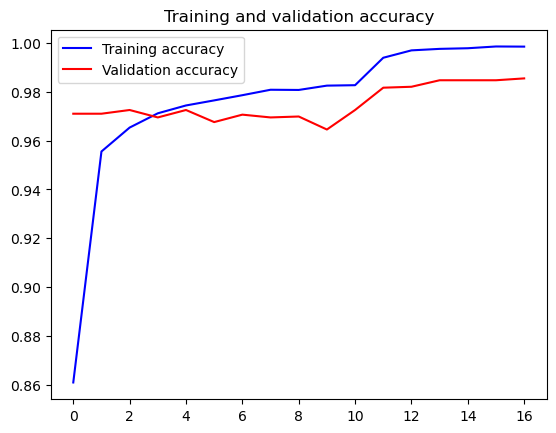

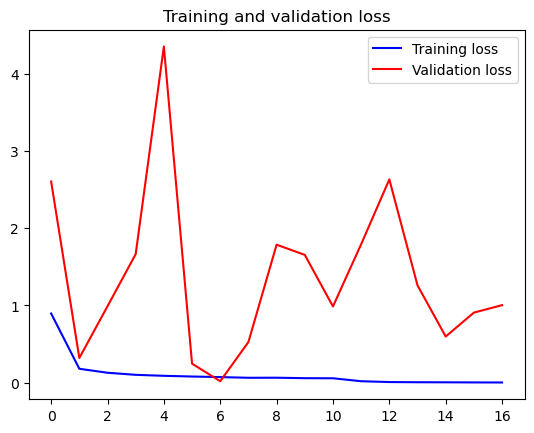

In [ ]:
epochs = list(results.keys())
val_accuracy = [result[0] for result in results.values()]
accuracy = [result[1] for result in results.values()]
val_loss = [result[2] for result in results.values()]
loss = [result[3] for result in results.values()]


epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'b', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation accuracy')

plt.title('Training and validation accuracy')
plt.legend()
plt.figure()

plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')

plt.title('Training and validation loss')
plt.legend()
plt.show()

In [ ]:
#Load the model with the highest validation accuracy
best_epoch = max(results, key=lambda k: results[k][0])
print("Best Epoch: ", best_epoch)

model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224')
model.classifier = nn.Linear(model.classifier.in_features, num_classes)
model.config.num_labels = num_classes
model_path = f'./ViT_saves/{model_id}/model_epoch_{best_epoch}.pt'
model.load_state_dict(torch.load(model_path))

# Check if GPU is available and move model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

Best Epoch:  17


ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0): ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=768, out_

### Testing and Evaluation

In the same way as before, we evaluate the model on the test set and display the incorrectly classified images.

In [ ]:
model.eval()  # Set the model to evaluation mode
test_running_corrects = 0
total_test_samples = 0

with torch.no_grad():  # No gradients needed
    for pixel_values, labels in test_loader:
        pixel_values = pixel_values.to(device)
        labels = labels.to(device)

        outputs = model(pixel_values)
        logits = outputs.logits
        _, preds = torch.max(logits, 1)

        test_running_corrects += torch.sum(preds == labels.data)
        total_test_samples += labels.size(0)

test_accuracy = test_running_corrects.double() / total_test_samples
print(f'Test Accuracy: {test_accuracy:.4f}')

Test Accuracy: 0.9916


In [ ]:
# Set the model to evaluation mode
model.eval()

# Dictionaries to store correct predictions and total samples per class
class_correct = dict()
class_total = dict()
incorrect_samples = []

# Initialize dictionaries
for class_index, class_name in enumerate(test_loader.dataset.classes):
    class_correct[class_name] = 0
    class_total[class_name] = 0

with torch.no_grad():  # No gradients needed
    for pixel_values, labels in test_loader:
        pixel_values = pixel_values.to(device)
        labels = labels.to(device)

        outputs = model(pixel_values)
        logits = outputs.logits
        _, preds = torch.max(logits, 1)

        # Compare predictions with the true labels
        correct_tensor = preds.eq(labels.data.view_as(preds))
        
        # Iterate over correct tensor and count correct predictions
        for i in range(len(labels)):
            label = labels.data[i]
            class_name = test_loader.dataset.classes[label]
            class_correct[class_name] += correct_tensor[i].item()
            class_total[class_name] += 1
            if not correct_tensor[i].item():
                incorrect_samples.append((pixel_values[i], label, preds[i].item()))

# Calculate and print accuracy for each class
for class_name in class_correct:
    accuracy = 100 * float(class_correct[class_name]) / class_total[class_name]
    if accuracy != 100:
        print(f'Accuracy of {class_name} : {accuracy:.2f}%')

print("Total number of incorrectly classified birds in the test dataset: ", len(incorrect_samples))

Accuracy of ANDEAN GOOSE : 80.00%
Accuracy of AUSTRAL CANASTERO : 60.00%
Accuracy of BALTIMORE ORIOLE : 80.00%
Accuracy of BLACK NECKED STILT : 80.00%
Accuracy of BLUE GRAY GNATCATCHER : 80.00%
Accuracy of CANVASBACK : 80.00%
Accuracy of CERULEAN WARBLER : 80.00%
Accuracy of CRESTED SERPENT EAGLE : 80.00%
Accuracy of DOUBLE BRESTED CORMARANT : 80.00%
Accuracy of EASTERN GOLDEN WEAVER : 80.00%
Accuracy of GRAY PARTRIDGE : 40.00%
Accuracy of HAMERKOP : 80.00%
Accuracy of MALACHITE KINGFISHER : 80.00%
Accuracy of MCKAYS BUNTING : 80.00%
Accuracy of ORANGE BREASTED TROGON : 80.00%
Accuracy of PUNA TEAL : 80.00%
Accuracy of RUBY THROATED HUMMINGBIRD : 80.00%
Accuracy of SAYS PHOEBE : 80.00%
Accuracy of WILLOW PTARMIGAN : 80.00%
Total number of incorrectly classified birds in the test dataset:  22


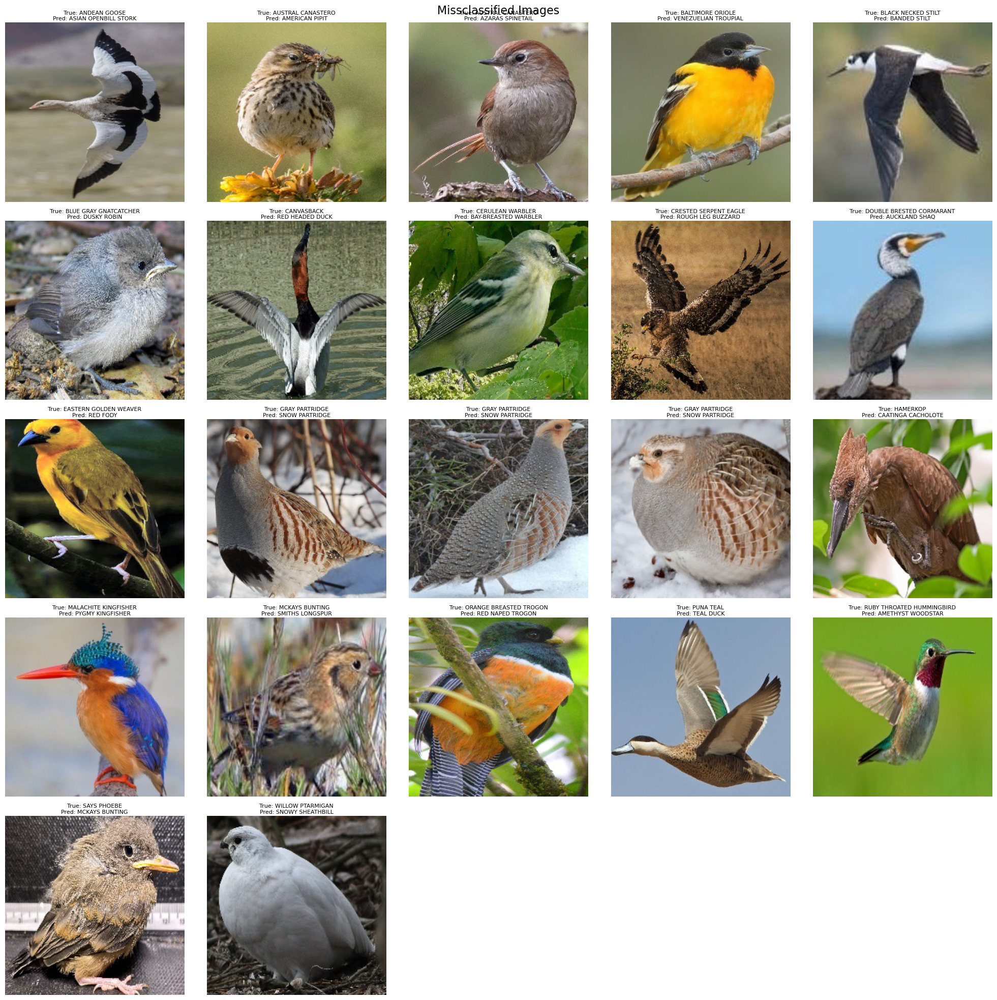

In [ ]:
class_names = test_loader.dataset.classes

def visualize_images(incorrect_images, class_names, grid_size=5):
    
    pixel_values = np.array([i[0].cpu() for i in incorrect_images])
    labels = [i[1] for i in incorrect_images]
    predicted_labels =  [i[2] for i in incorrect_images]
    
    # Calculate how many images to display
    num_images = min(len(pixel_values), grid_size * grid_size)
    
    # Set up the figure size and grid layout
    plt.figure(figsize=(20, 20))
    plt.suptitle('Missclassified Images', fontsize=16)

    # Iterate over the images and labels up to num_images
    for i in range(num_images):
        img = pixel_values[i].cpu().numpy() # Convert tensor to numpy array
        img = np.transpose(img, (1, 2, 0))  # Rearrange the dimensions
        normalizer = Normalize(vmin=img.min(), vmax=img.max())
        img = normalizer(img)
        
        # Determine subplot position
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(img)
        plt.axis('off')
        
        # Label the image with true and predicted classes
        true_class = class_names[labels[i]]
        pred_class = class_names[predicted_labels[i]]
        plt.title(f'True: {true_class}\nPred: {pred_class}', fontsize=8, pad=3)

    # Adjust layout to avoid overlap
    plt.tight_layout(pad=1.0)
    plt.show()

visualize_images(incorrect_samples, class_names)

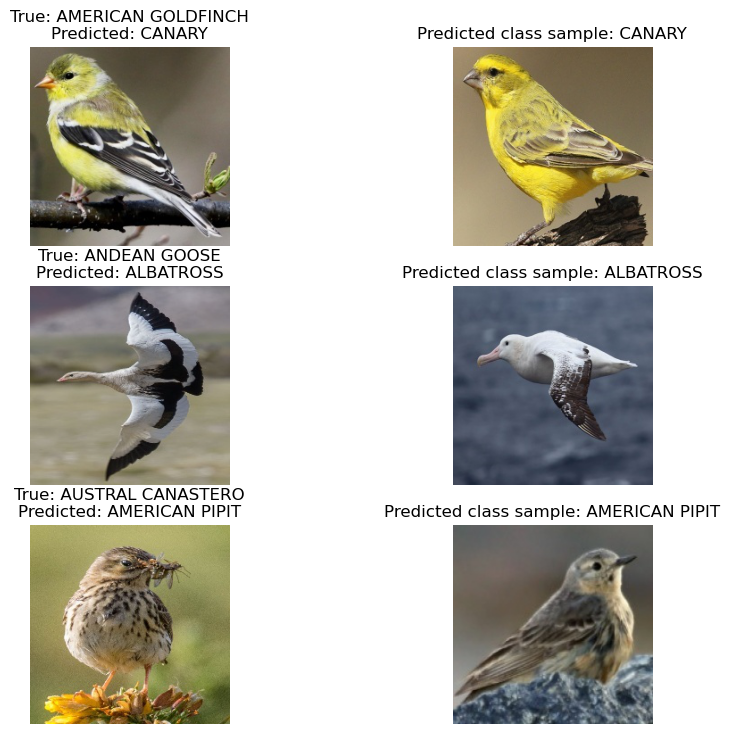

In [45]:
# Take 3 misclassified images and display them alongside a sample image of the predicted class

# Get the indices of the first three misclassified images

def get_misclassified_images(incorrect_samples, num_images=3):
    misclassified_images = []
    for i in range(num_images):
        misclassified_images.append(incorrect_samples[i])
    return misclassified_images

misclassified_images = get_misclassified_images(incorrect_samples)

# Display the misclassified images alongside a sample image of the predicted class

plt.figure(figsize=(10, 15))

for i, (pixel_values, true_label, predicted_label) in enumerate(misclassified_images):
    # Get the class directory of the predicted class
    predicted_class_dir = os.path.join(train_directory, class_names[predicted_label])
    
    # Get a list of images in the class directory
    predicted_class_images = os.listdir(predicted_class_dir)
    
    # Randomly select an image from the class
    predicted_image_name = random.choice(predicted_class_images)
    predicted_image_path = os.path.join(predicted_class_dir, predicted_image_name)
    
    # Load and display the predicted image
    predicted_image = Image.open(predicted_image_path)
    
    # Display the misclassified image
    img = pixel_values.cpu().numpy() # Convert tensor to numpy array
    img = np.transpose(img, (1, 2, 0))  # Rearrange the dimensions
    normalizer = Normalize(vmin=img.min(), vmax=img.max())
    img = normalizer(img)
    
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"True: {class_names[true_label]}\nPredicted: {class_names[predicted_label]}")
    
    # Display the predicted image
    plt.subplot(5, 2, 2*i+2)
    plt.imshow(predicted_image)
    plt.axis('off')
    plt.title(f"Predicted class sample: {class_names[predicted_label]}")

plt.show()

## Ensemble methods

In this section, we combine the predictions of the CNN model and the Vision Transformer model. We will use a simple technique in which we take the maximum of the two models' predictions (in the probability vectors) to get the final prediction.

In [ ]:
# use Resnet50 model and Visual Transformer model to create ensemble model

num_classes = 525

Resnet_model = load_model('Resnet50_50epochs_fulldataset.h5')

model_path = 'ViT_saves/full_model/model_epoch_12.pt'

ViT_model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224')
ViT_model.classifier = nn.Linear(ViT_model.classifier.in_features, num_classes)
ViT_model.config.num_labels = num_classes
ViT_model.load_state_dict(torch.load(model_path))

2024-05-28 13:41:58.709977: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-28 13:42:00.416238: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 7247 MB memory:  -> device: 0, name: Tesla V100-PCIE-16GB, pci bus id: 0001:00:00.0, compute capability: 7.0


<All keys matched successfully>

In [ ]:
feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224')

test_directory = './test'

test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

test_dataset = datasets.ImageFolder(root='./test', transform=test_transforms)

test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4, collate_fn=collate)

In [ ]:
# Check if GPU is available and move model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
ViT_model.to(device)

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0): ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=768, out_

Since the Vision transformer model uses logits instead of probabilities, we will convert the logits to probabilities using the softmax function. 

In [ ]:
# get predictions of the ViT model

ViT_model.eval()

all_probs = []

with torch.no_grad():  # No gradients needed
    for pixel_values, labels in test_loader:
        # Move pixel values to the appropriate device
        pixel_values = pixel_values.to(device)

        # Get predictions from the PyTorch model
        pytorch_outputs = ViT_model(pixel_values)
        pytorch_logits = pytorch_outputs.logits
        pytorch_probs = F.softmax(pytorch_logits, dim=1)  # Convert logits to probabilities
        pytorch_probs = pytorch_probs.cpu().numpy()  # Move to CPU and convert to numpy array

        all_probs.append(pytorch_probs)
    
all_probs = np.concatenate(all_probs)

`all_probs` is a list of the probability vectors of the Vision Transformer Model. Just to be sure, we check if we get the same test accuracy as before. 

In [ ]:
# get accuracy of pytorch model

pytorch_preds = np.argmax(all_probs, axis=1)
true_classes = test_dataset.targets

pytorch_accuracy = np.mean(pytorch_preds == true_classes)
pytorch_accuracy

0.9923809523809524

We do the same thing with our CNN model probability vectors to check we get the same test accuracy as before.

In [ ]:
tensorflow_probs = Resnet_model.predict(test_generator)

#get accuracy of resnet model

tensorflow_preds = np.argmax(tensorflow_probs, axis=1)

tensorflow_accuracy = np.mean(tensorflow_preds == true_classes)
tensorflow_accuracy

83/83 [==============================] - 5s 56ms/step


0.9889523809523809

We now combine the predictions of the two models and check the test accuracy.

In [ ]:
# Ensemble the predictions by taking average of the probabilities
print(all_probs.shape)
print(tensorflow_probs.shape)

ensemble_probs = np.maximum(all_probs, tensorflow_probs)
print(ensemble_probs.shape)

ensemble_preds = np.argmax(ensemble_probs, axis=1)

true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# get the accuracy

ensemble_accuracy = np.max(ensemble_preds == true_classes)

print(f"Ensemble accuracy: {ensemble_accuracy * 100:.2f}%")

(2625, 525)
(2625, 525)
(2625, 525)
Ensemble accuracy: 100.00%


We get an ensemble accuracy of 100% on the test set. 